# Imports

In [1]:
import os
import pickle
import pprint

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from openretina.dataloaders import (
    MovieDataSet,
    MovieSampler,
)
from openretina.misc import CustomPrettyPrinter
from openretina.plotting import (
    play_sample_batch,
    play_stimulus,
    undo_video_normalization,
)
from openretina.stimuli import load_chirp, load_moving_bar, load_moving_bar_stack

%load_ext autoreload
%autoreload 2

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
DATA_FOLDER = "/Data/fd_export"

In [ ]:
!ls $DATA_FOLDER

2516.72s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


/bin/bash: line 1: DATA_FOLDER: command not found
2D_test.ipynb			    hoefling_2022_stimuli_viz.ipynb
GRU_test.ipynb			    import_data.ipynb
LNP_test.ipynb			    model_comparisons.ipynb
baccus_data.ipynb		    random.ipynb
cell-type_training.ipynb	    test_upsampling.ipynb
data_comparison.ipynb		    training_loop_new_data.ipynb
gaussian_test.ipynb		    training_loop_wandb.ipynb
generate_mei_example.ipynb	    wrangling.ipynb
hoefling_2022_model_teardown.ipynb


# Visualising stimuli

In [3]:
mb_raw = load_moving_bar()
print(f"{mb_raw.shape=}")
mb_stimulus = torch.Tensor(mb_raw.transpose(3, 0, 1, 2))
print(f"{mb_stimulus.shape=}")

mb_raw.shape=(1104, 18, 16, 2)
mb_stimulus.shape=torch.Size([2, 1104, 18, 16])


Video has not the correct values for plotting. Min-max normalising.


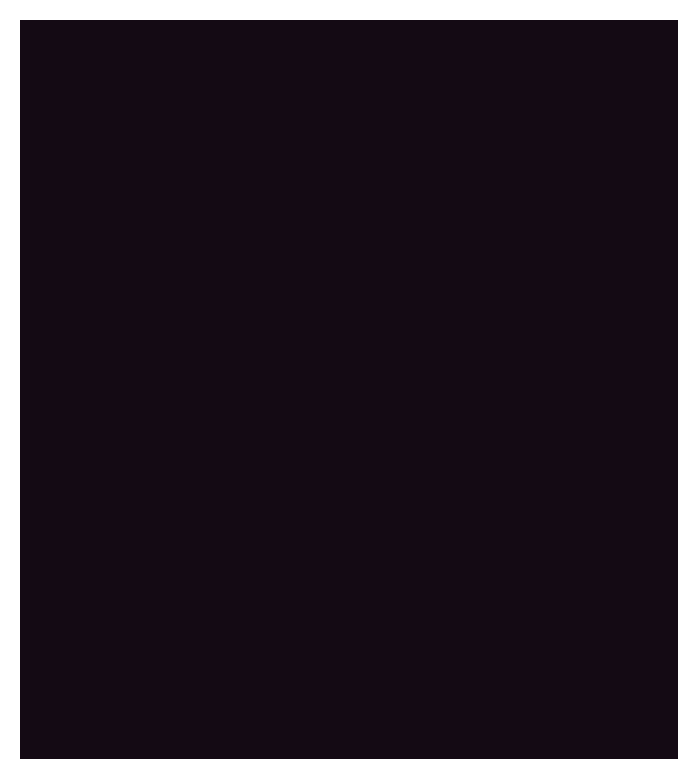

In [4]:
play_stimulus(mb_stimulus)

In [14]:
mb_stack = load_moving_bar_stack()
mb_stack = torch.tensor(mb_stack.transpose(0, 4, 1, 2, 3))

Video has not the correct values for plotting. Min-max normalising.


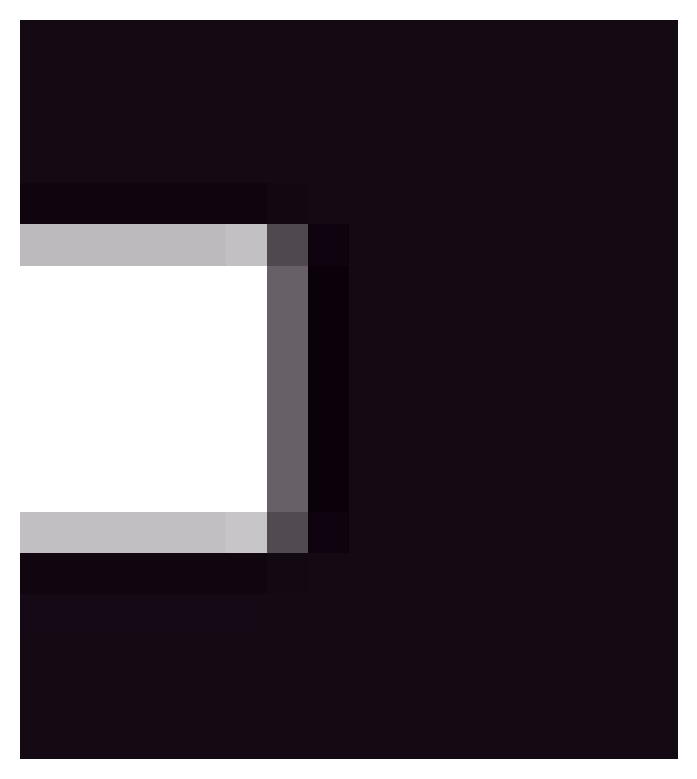

In [15]:
play_stimulus(mb_stack[0])

# ! NOTE:

In [ ]:
#! There is something wrong with the moving bar stack. It is cutting in between movement. See above

In [39]:
raw_chirp = load_chirp()
print(f"{raw_chirp.shape=}")
chirp_stimulus = torch.Tensor(raw_chirp.transpose(3, 0, 1, 2))
print(f"{chirp_stimulus.shape=}")

raw_chirp.shape=(990, 18, 16, 2)
chirp_stimulus.shape=torch.Size([2, 990, 18, 16])


Video has not the correct values for plotting. Min-max normalising.


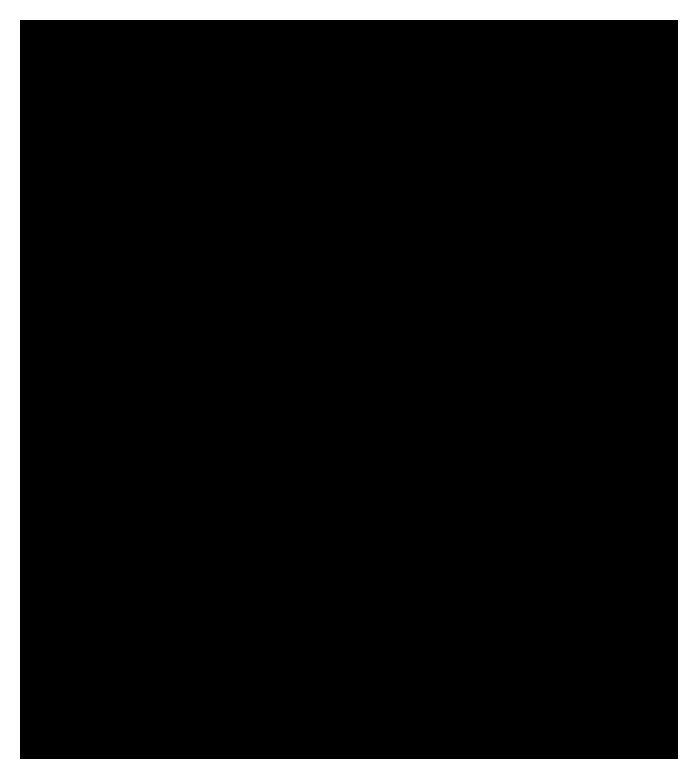

In [40]:
play_stimulus(chirp_stimulus)

In [22]:
movies_path = os.path.join(DATA_FOLDER, "2024-01-11_movies_dict_8c18928.pkl")
movies_dict = pickle.load(open(movies_path, "rb"))

In [23]:
test_movie = movies_dict["test"]

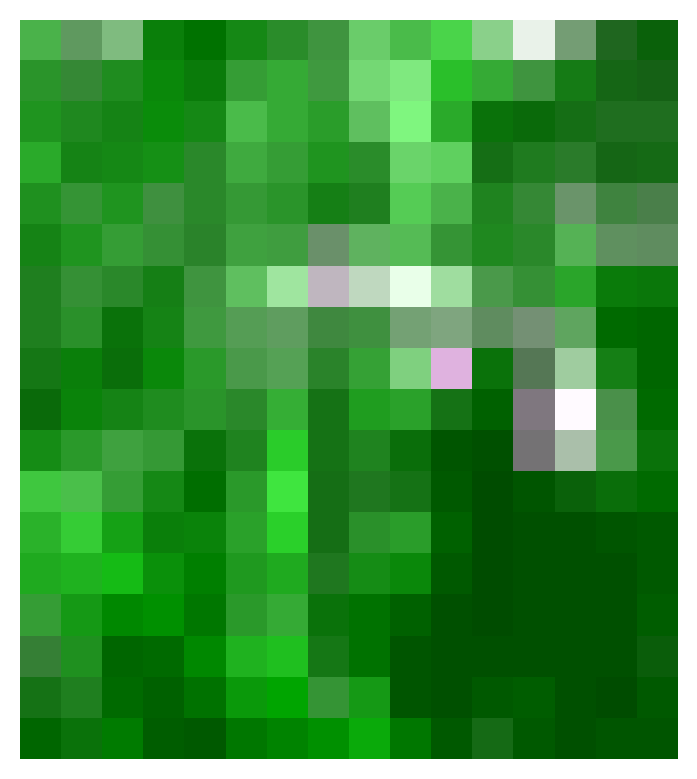

In [35]:
play_stimulus(undo_video_normalization(torch.tensor(test_movie)))

---

# Testing alignment with responses

In [5]:
from openretina.h5_handling import load_h5_into_dict
from openretina.neuron_data_io import make_final_responses

data_path = os.path.join(
    DATA_FOLDER, "2024-03-28_neuron_data_responses_484c12d_djimaging.h5"
)
movies_path = os.path.join(DATA_FOLDER, "2024-01-11_movies_dict_8c18928.pkl")
responses = load_h5_into_dict(data_path)

Loading HDF5 file contents:   0%|          | 0/1474 [00:00<?, ?item/s]

In [6]:
stim_dataloaders_dict = make_final_responses(responses, response_type="natural")
movies_dict = pickle.load(open(movies_path, "rb"))

Upsampling natural traces to get final responses.:   0%|          | 0/67 [00:00<?, ?it/s]

In [ ]:
test_session = "session_1_ventral1_20200226"

In [44]:
stim_dataloaders_dict.keys()

dict_keys(['session_1_ventral1_20200226', 'session_1_ventral1_20200528', 'session_1_ventral1_20200707', 'session_1_ventral1_20201021', 'session_1_ventral1_20201030', 'session_1_ventral1_20210929', 'session_1_ventral1_20210930', 'session_1_ventral2_20200302', 'session_1_ventral2_20200707', 'session_1_ventral2_20201021', 'session_1_ventral2_20201022', 'session_1_ventral2_20201030', 'session_1_ventral2_20201117', 'session_1_ventral2_20210910', 'session_1_ventral2_20210921', 'session_1_ventral2_20210929', 'session_1_ventral2_20210930', 'session_1_ventral2_20211130', 'session_2_ventral1_20200226', 'session_2_ventral1_20200303', 'session_2_ventral1_20200528', 'session_2_ventral1_20200529', 'session_2_ventral1_20200701', 'session_2_ventral1_20201021', 'session_2_ventral1_20201030', 'session_2_ventral1_20210929', 'session_2_ventral2_20200303', 'session_2_ventral2_20201016', 'session_2_ventral2_20201021', 'session_2_ventral2_20201022', 'session_2_ventral2_20201030', 'session_2_ventral2_20201117

In [8]:
stim_dataloaders_dict = make_final_responses(responses, response_type="chirp")

Upsampling chirp traces to get final responses.:   0%|          | 0/67 [00:00<?, ?it/s]

/Projects/open-retina/openretina/neuron_data_io.py:529: UserWarning: You seem to already have computed `responses_final` for a stim_id of 5. Overwriting with 1 (chirp).
  warnings.warn(


In [45]:
stim_dataloaders_dict[test_session]["chirp_responses_final"].shape

(131, 750)

In [21]:
stim_dataloaders_dict[test_session]["chirp_spikes"].shape

(131, 1501)

In [27]:
chirp_trigger_times = stim_dataloaders_dict[test_session]["chirp_trigger_times"]

In [29]:
# All the same for each neuron so just grab the first
chirp_trigger_times = chirp_trigger_times[0]
chirp_trigger_times

array([ 21.392,  26.354,  54.382,  59.386,  87.414,  92.418, 120.446,
       125.45 , 153.478, 158.482], dtype=float32)

In [31]:
chirp_aligned = load_chirp(trigger_times=chirp_trigger_times)

In [32]:
chirp_aligned.shape

(5594, 18, 16, 2)

In [33]:
5594 / 1501

3.7268487674883413

In [35]:
5594 / (30 * 5)

37.29333333333334

In [36]:
5 * 5 * 30

750

In [37]:
chirp = load_chirp()

In [38]:
chirp.shape

(990, 18, 16, 2)

In [46]:
mb_stimulus.shape

torch.Size([2, 1104, 18, 16])

In [48]:
mbs = np.split(mb_stimulus, 8, axis=1)

In [50]:
mbs[0].shape

torch.Size([2, 138, 18, 16])

In [52]:
mb_trigger_times = stim_dataloaders_dict[test_session]["mb_trigger_times"]

In [53]:
mb_trigger_times = mb_trigger_times[0]
mb_trigger_times

array([ 24.714,  28.768,  32.822,  36.876,  40.93 ,  44.984,  49.038,
        53.092,  57.144,  61.2  ,  65.254,  69.308,  73.362,  77.416,
        81.468,  85.522,  89.578,  93.632,  97.684, 101.738, 105.792,
       109.846, 113.9  , 117.954], dtype=float32)

In [54]:
mb_trigger_times.shape

(24,)

In [65]:
mb_aligned = load_moving_bar(trigger_times=mb_trigger_times)

In [9]:
stim_dataloaders_dict = make_final_responses(responses, response_type="mb")

Upsampling mb traces to get final responses.:   0%|          | 0/67 [00:00<?, ?it/s]

/Projects/open-retina/openretina/neuron_data_io.py:529: UserWarning: You seem to already have computed `responses_final` for a stim_id of 1. Overwriting with 2 (mb).
  warnings.warn(


In [73]:
stim_dataloaders_dict[test_session]["mb_responses_final"].shape

(131, 2880)